# Clustering

In [1]:
%load_ext autoreload
%autoreload 2



import pathlib
import sys
import matplotlib.pyplot as plt
import numpy as np
import sklearn

# TO CHANGE
# absolute path to ACCAL/ACCAL folder
appPath = pathlib.Path(r"D:\Stage\ACCAL\ACCAL")
sys.path.append(str(appPath))

import modules.sampling
import modules.clusters




# Path to data 
dataFolderPath = pathlib.Path(r"D:\Stage\ACCAL\data\R_58") ### To change 


In [2]:
matrixPath = pathlib.Path(dataFolderPath,"temp","distMatrix.npy")
dissMatrix = np.load(matrixPath)

In [10]:
dissMatrix

array([[0.        , 0.97062824, 0.92320252, 0.75127832],
       [0.97062824, 0.        , 0.        , 1.        ],
       [0.92320252, 0.        , 0.        , 0.5362346 ],
       [0.75127832, 1.        , 0.5362346 , 0.        ]])

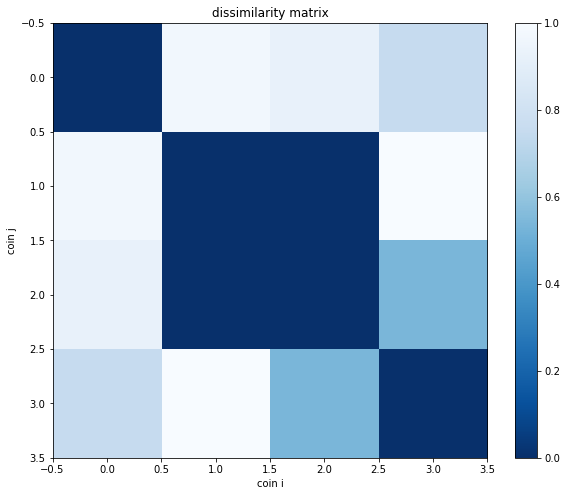

In [9]:
plt.figure(figsize=(10,8))
plt.imshow(dissMatrix,cmap="Blues_r")
plt.xlabel("coin i")
plt.ylabel("coin j")
plt.title("dissimilarity matrix")
plt.colorbar()
plt.savefig("dissMatrix",bbox_inches='tight',dpi=300)
plt.show()


In [5]:
### Création vecteur initial
trilMat = np.tril(dissMatrix)
trilMat[trilMat == 0 ] =np.nan 
histVec = trilMat.ravel()
histVec = np.array(sorted(histVec[~np.isnan(histVec)]))

nbCut = int(len(histVec)*0.01)
#distCut = histVec[nbCut]
distCut = 0.2
print("distCut :",distCut)


distCut : 0.2


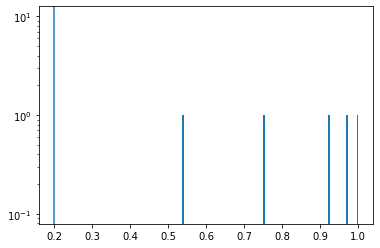

In [6]:
n,bins,patches = plt.hist(histVec,100,log=True)
plt.axvline(distCut,ymin=0,ymax=1)
plt.show()

In [8]:
from sklearn.cluster import AgglomerativeClustering
hierarircalModel = AgglomerativeClustering(n_clusters=None,affinity='precomputed',linkage='single',distance_threshold=distCut)
res = hierarircalModel.fit(dissMatrix)
Zinit = res.labels_
print("Vecteur initial Z:")
print(Zinit)

Vecteur initial Z:
[1 0 0 2]


In [16]:
#### Gibbs sampling

### Hypermarameters

# for r
modules.sampling.etha_ =2
modules.sampling.sigma_ =1

# for p 
modules.sampling.u_ = 1
modules.sampling.v_ = 1

# for Z
A = histVec[histVec<= distCut]
B = histVec[histVec>distCut]

### fit value
deltaA,alphaA,betaA = modules.clusters.fitValues(A)
deltaB,alphaB,betaB = modules.clusters.fitValues(B)

In [17]:
print(deltaB,alphaB,betaB)

115.74431134109095 257.49897648919244 2.0197724839486484


In [18]:
print(deltaA,alphaA,betaA)

1023.7291179422509 285.4807984187269 0.1496167792238003


In [19]:
modules.sampling.delta1,modules.sampling.alpha_ ,modules.sampling.beta_  = deltaA,alphaA,betaA
modules.sampling.delta2, modules.sampling.xsi_ ,modules.sampling.gamma_  = deltaB,alphaB,betaB


D:\Stage\ACCAL\ACCAL\modules\clusters.py:57: RuntimeWarning: divide by zero encountered in log
  logRes = logC + (delta1-1)*np.log(x) - (delta1+alpha)*np.log(x+beta)


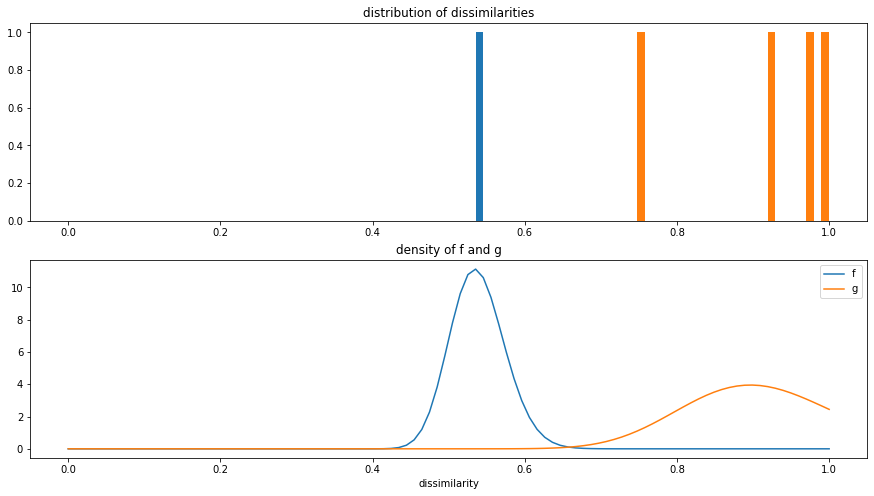

In [24]:
#### Verification des résultats
bins = np.linspace(0, 1, 100)

X = np.linspace(0,1,100)
YA = np.zeros_like(X)
YB = np.zeros_like(X)

for idx,x in enumerate(X):
    YA[idx] = np.exp(modules.clusters.logPdfHyper(x,deltaA,alphaA,betaA))
    YB[idx] = np.exp(modules.clusters.logPdfHyper(x,deltaB,alphaB,betaB))
    

fig, axes = plt.subplots(2,1,figsize=(15,8))
ax1,ax2 = axes
ax1.hist(A,bins)
ax1.hist(B,bins)
ax1.set_title("distribution of dissimilarities")
    
ax2.plot(X,YA,label="f")
ax2.plot(X,YB,label="g")
ax2.set_title("density of f and g")
ax2.set_xlabel("dissimilarity")
plt.legend()
plt.savefig("distribution",bbox_inches='tight',dpi=300)
plt.show()

In [25]:
Z = np.copy(Zinit)

## valeur initiale
p=0.5
r = 3


n,_ = np.shape(dissMatrix)
D = np.copy(dissMatrix)

In [26]:

### burnin 
nbBurnin = 20

for i in range(nbBurnin):
    print(f"{i}/{nbBurnin}",end='\r')
    #Draw r
    r = modules.sampling.drawSampleMCMCforR(r,p,Z)
    #Draw p
    p = modules.sampling.drawSampleforP(r,Z,n)
    #Draw Z
    for i in range(n):
        Z = modules.sampling.sampleNewZForI(i,p,r,Z,D)
        

D:\Stage\ACCAL\ACCAL\modules\sampling.py:238: RuntimeWarning: divide by zero encountered in log
  logPI=logPI + (delta1-1)*np.log(D[i,j]) - gammaln(delta1)
D:\Stage\ACCAL\ACCAL\modules\sampling.py:277: RuntimeWarning: divide by zero encountered in log
  logPI =logPI + (delta2-1)*np.log(D[i,j]) - gammaln(delta2)
D:\Stage\ACCAL\ACCAL\modules\sampling.py:344: RuntimeWarning: invalid value encountered in true_divide
  probVec = probVec/np.sum(probVec)


ValueError: probabilities contain NaN

In [23]:
# Calcul final 
samples = []
for i in range(50):
    print(f"{i}/30",end='\r')
    #Draw r
    r = modules.sampling.drawSampleMCMCforR(r,p,Z)
    #Draw p
    p = modules.sampling.drawSampleforP(r,Z,n)
    #Draw Z
    for j in range(n):
        Z = modules.sampling.sampleNewZForI(j,p,r,Z,D)
        
    if i%2 == 0:
        samples.append(Z)


probMat = modules.sampling.getProbMatrix(samples)

ValueError: probabilities contain NaN

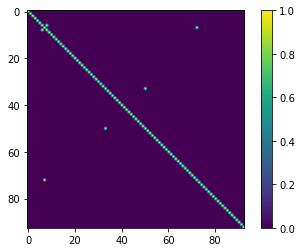

In [32]:

plt.imshow(probMat)
plt.colorbar()
np.save(pathlib.Path(dataFolderPath,"temp","probMat.npy"),probMat)

##### plt.figure(figsize=(12,10))
plt.imshow(1-probMat,cmap="Blues_r")
plt.colorbar()

In [145]:
probT = np.tril(probMat,-1)


In [146]:
probT

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [173]:
argsMax = np.argsort(-probT.ravel())

In [174]:
argA,argB = np.unravel_index(argsMax[:15],shape = probT.shape)

In [175]:
imgList = sorted(pathlib.Path(dataFolderPath,"temp","croppedImages").glob("*.png"))

In [ ]:
from sklearn.cluster import AgglomerativeClustering
distProb = 1 - probMat

model = AgglomerativeClustering(n_clusters=None,affinity = 'precomputed',distance_threshold=0.1,linkage='average')
res = model.fit(distProb)
#tpr,fdr=df.getMetrics(Ztrue,res.labels_)
#print("True Positive : ",tpr)
#print("False discovery rate: ",fdr)


In [ ]:
print(res

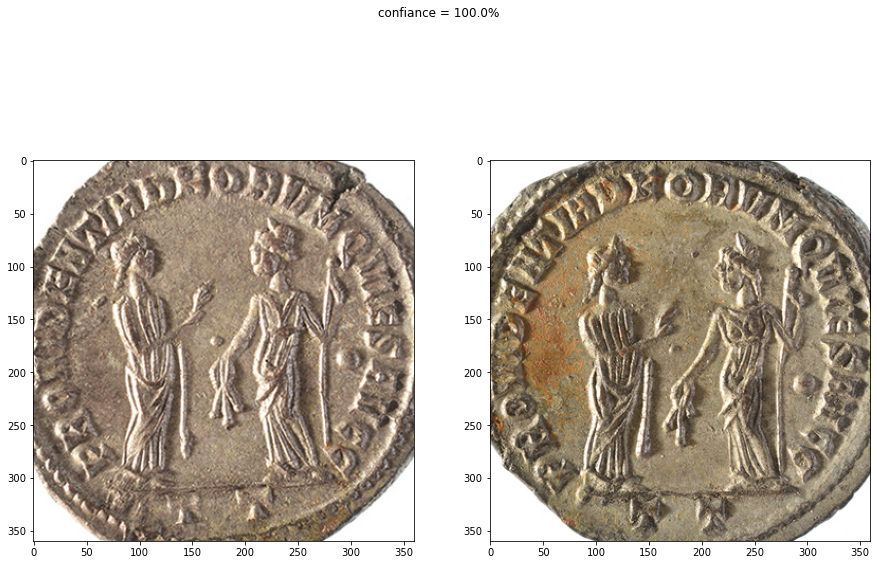

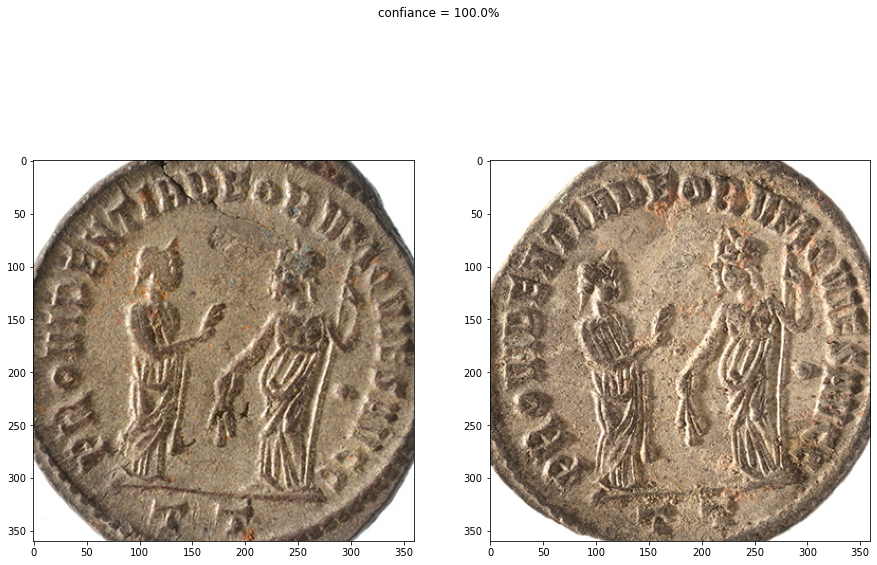

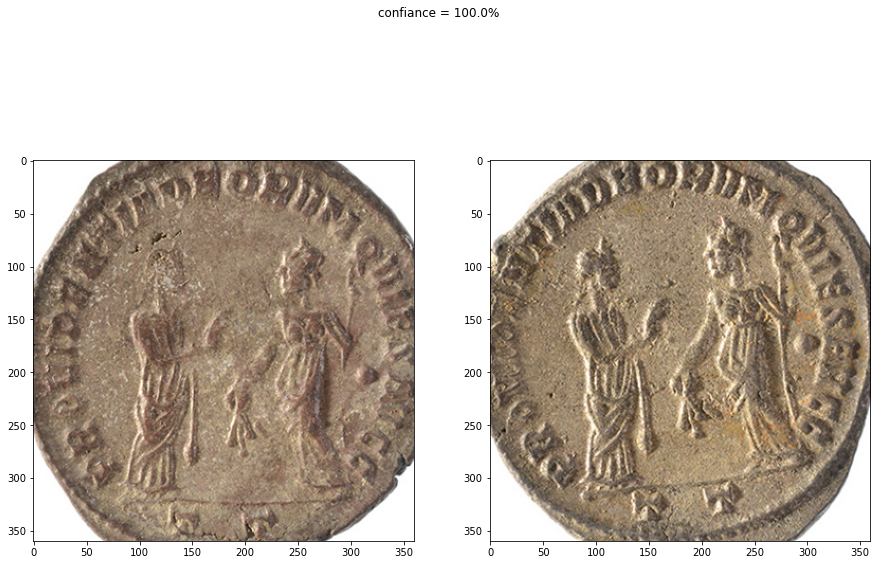

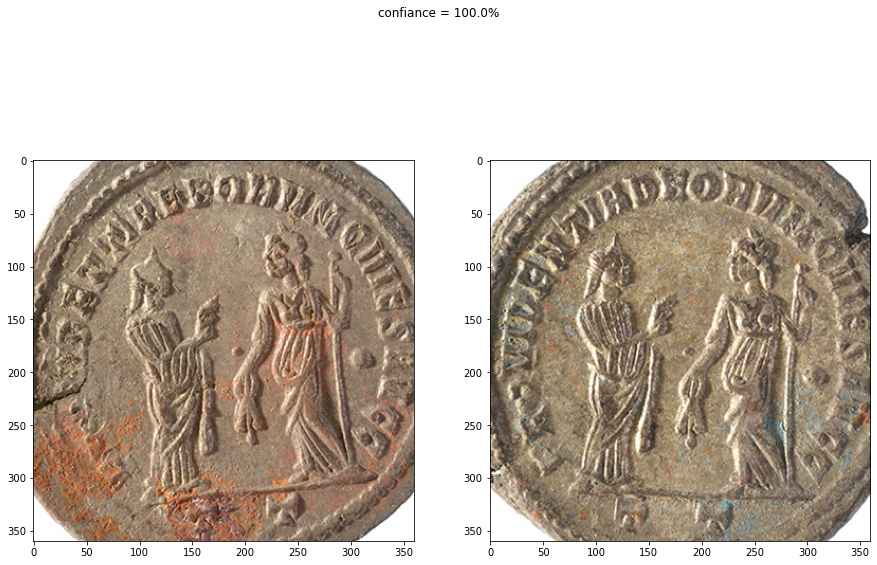

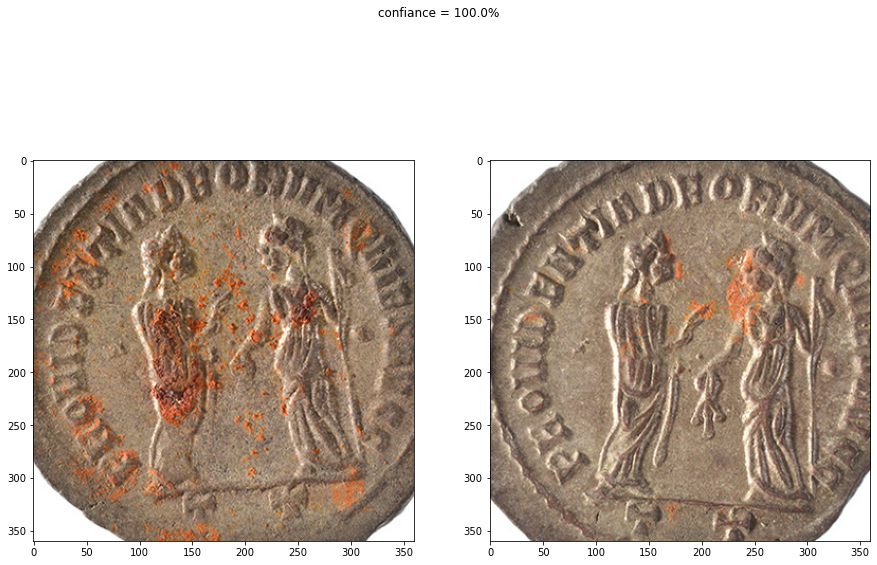

...

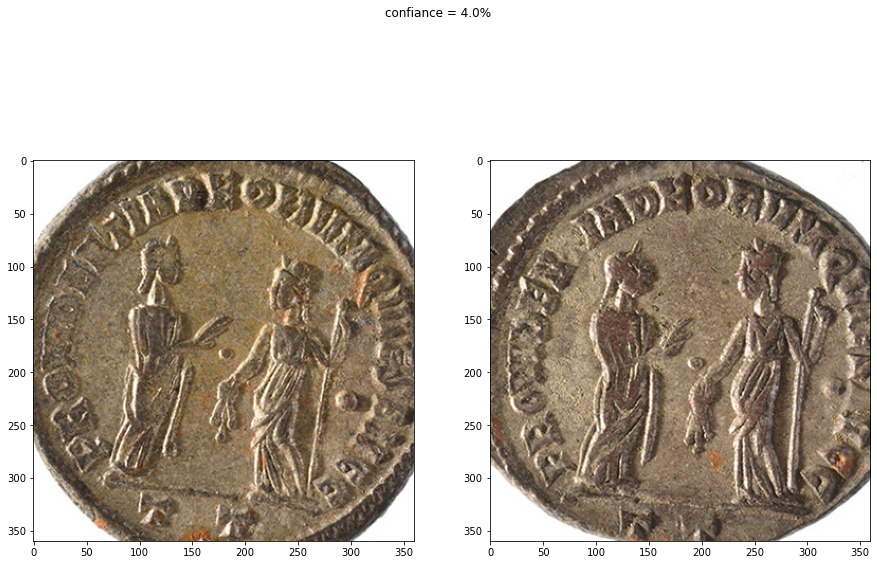

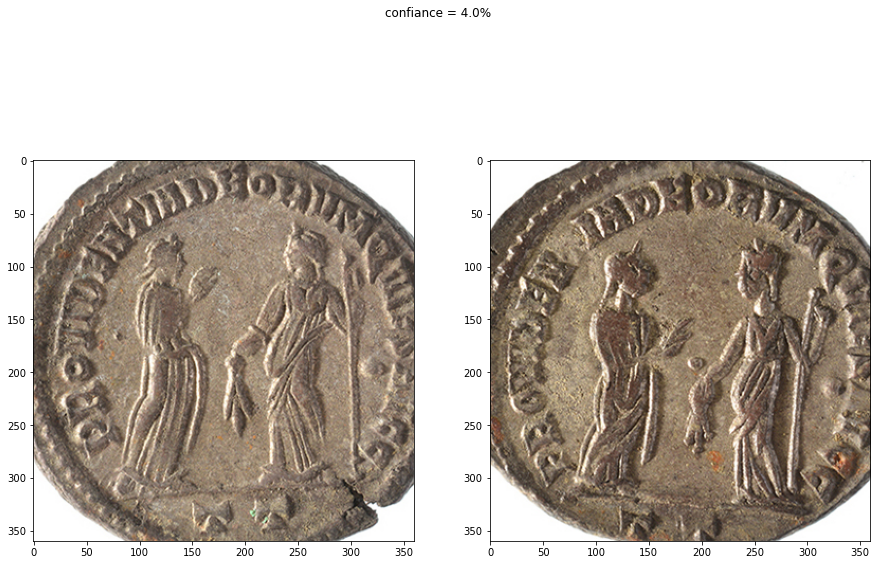

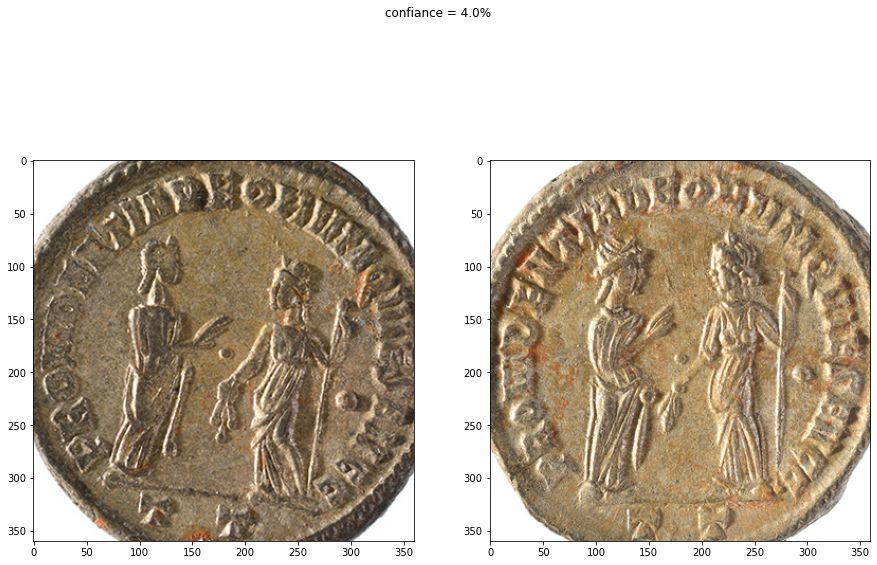

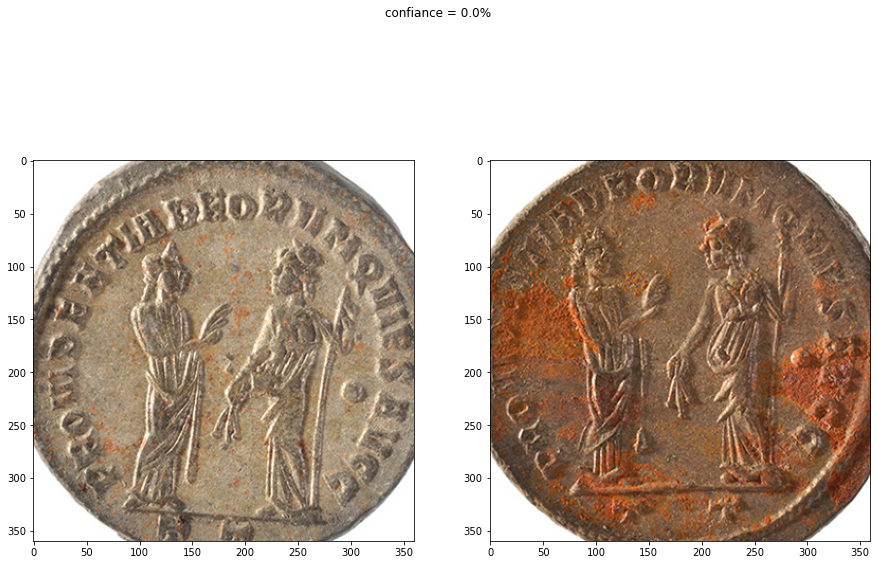

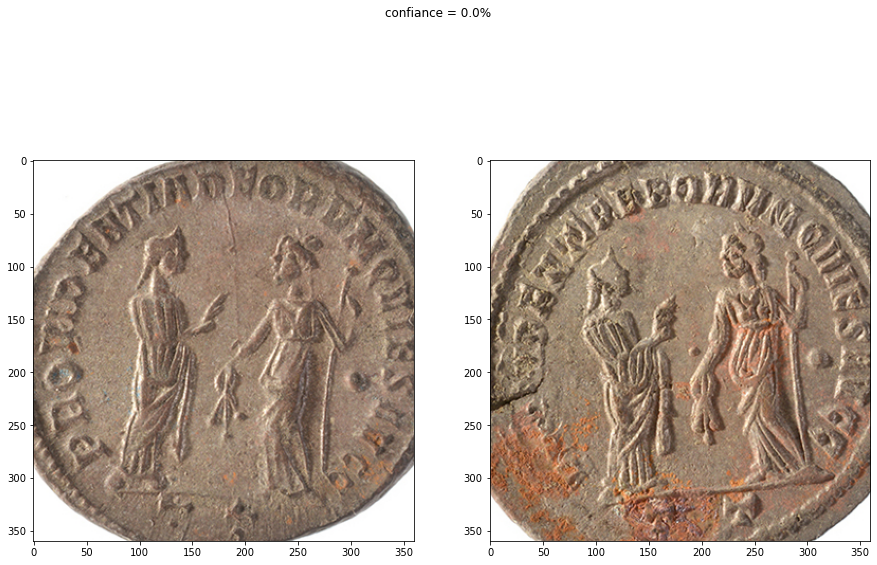

In [193]:
for i in range(15):
    fig,axes = plt.subplots(1,2,figsize=(15,10))
    img1 = plt.imread(imgList[argA[i]])
    img2 = plt.imread(imgList[argB[i]])
    axes[0].imshow(img1)
    axes[1].imshow(img2)
    fig.suptitle(f"confiance = {probMat[argA[i],argB[i]]*100}%")